In [1]:
import pandas as pd
import numpy as np
import ruptures as rp
from prediction_pipeline.preprocessing import *
from sklearn.linear_model import LinearRegression
from glob import glob
from multiprocessing import Pool
from scipy.linalg import cholesky
%load_ext autoreload
%autoreload 2

from sklearn.decomposition import PCA, FactorAnalysis

/home/hv270/platelets/lib/python3.7/site-packages/FlowCytometryTools/core/docstring.py:56: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.
  doc = dedent(doc)


# About this notebook

Here we adjust scattergrams for time-discrepancies.

We isolate a reference subset of the population : males between 40 and 60. Then we calibrate the adjustment on scattergrams from these individuals. And we then apply thge calibration procedure on other scattergrams.

In [2]:
data_dir = "/home/hv270/rds/rds-who1000-cbrc/user/wja24/shared/hv270/data_home"

In [3]:
PLT = pd.read_hdf("%s/processed/PLT_unadjusted.hdf" % data_dir,key="PLT")

In [4]:
X = PLT

# Check PFC cohort demographics

In [5]:
int_phen, meta = get_INTERVAL_phenotypes()
int_phen["days_since_start"] = (int_phen.day - int_phen.day.min()).dt.days

sys_phen = load_sys_phenotypes(data_dir)
sys_phen["time_col"] = pd.to_datetime(sys_phen["Date"],format="%d/%m/%Y")
sys_phen["days_since_start"] = (sys_phen["time_col"] - int_phen.day.min()).dt.days
sys_phen["yearday"] = sys_phen["time_col"].dt.dayofyear
sys_phen["hours"] = sys_phen.Time.str[:2].astype(int)
sys_phen.rename(columns={"ID":"SampleNo"},inplace=True)

phen = pd.concat([int_phen,sys_phen],axis=0)

Loading INTERVAL phenotypes
(48460, 760)
(45040, 760)
(38832, 760)
(112535, 11)
(102595, 11)
(17768, 772)
(32574, 777)
(32727, 777)
Checked that each Sample has one row max
Removing samples with less than 10 measurements per day
(30725, 782)
602 candidates summary files
Initially 1068 rows, 643 unique IDs
Finally 642 rows, 642 unique IDs


In [6]:
phen.loc[phen.machine.isnull(),"machine"] = 0.

In [7]:
sys_agesex, int_agesex = get_ages_sex()
sys_agesex = sys_agesex.loc[sys_agesex.index.isin(sys_phen.SampleNo)]
agesex = pd.concat((sys_agesex,int_agesex),axis=0)

Loading INTERVAL phenotypes
(48460, 760)
(45040, 760)
(38832, 760)
(112535, 11)
(102595, 11)
(17768, 772)
(32574, 777)
(32727, 777)
Checked that each Sample has one row max
Removing samples with less than 10 measurements per day
(30725, 782)


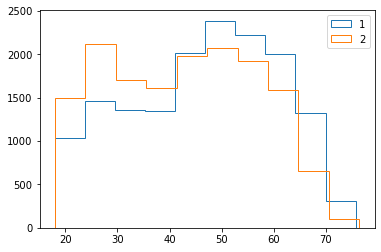

In [8]:
for sex, s_ in int_agesex.groupby("SEX"):
    plt.hist(s_["AGE"],histtype="step",label=sex)
plt.legend()

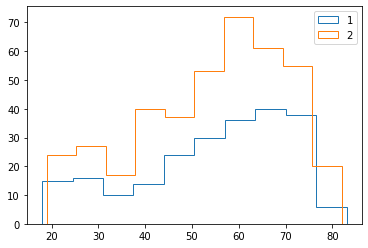

In [9]:
for sex, s_ in sys_agesex.groupby("SEX"):
    plt.hist(s_["AGE"],histtype="step",label=sex)
plt.legend()

In [10]:
# Reference set :
# -> Sex = 1
# -> Age between 40 and 60

In [11]:
#ref_IDs = agesex.loc[(agesex.SEX == 2) & (agesex.AGE >= 30) & (agesex.AGE <= 65)].index.tolist()

In [12]:
ref_IDs = agesex.loc[(agesex.SEX == 1) & (agesex.AGE >= 40) & (agesex.AGE <= 60)].index.tolist()

In [13]:
agesex.loc[agesex.index.isin(ref_IDs) & agesex.index.str.contains("C")].shape

(88, 2)

In [14]:
X_ref = X.loc[X.ID.isin(ref_IDs)]

# Compute breakpoints

For that, do PCA and features processing on all individuals in the reference set.

In [15]:
# fit PCA on all individuals in the reference frame

pca = PCA(n_components=2)
X_t = pd.DataFrame(index=X_ref.index)
X_t[["X_0","X_1"]] = pca.fit_transform(X_ref[FACS_COLS])
X_t["ID"] = X_ref["ID"]

In [16]:
# Compute features on X_t

def std_2nd_dim_high(df):
    Q_high = np.quantile(df.X_0,0.6)
    return df.loc[df.X_0 > Q_high,"X_1"].std()

def std_2nd_dim_low(df):
    Q_low = np.quantile(df.X_0,0.4)
    return df.loc[df.X_0 < Q_low,"X_1"].std()

g = X_t.groupby("ID")[["X_0","X_1"]]
#mean = g.mean()
median = g.median()
upper = g.quantile(0.9)
lower = g.quantile(0.1)
std = g.std()
iqr = g.quantile(0.75) - g.quantile(0.25)

print("Starting ratios")

ratio_upper = np.log10((upper["X_1"] - median["X_1"])/ (upper["X_0"] - median["X_1"]))
ratio_lower = np.log10((median["X_1"] - lower["X_1"]) / (median["X_0"] - lower["X_0"]))
ratio_std = np.log10(std["X_1"] / std["X_0"])

std_2_high = g.apply(std_2nd_dim_high)
std_2_low = g.apply(std_2nd_dim_low)

Starting ratios


In [17]:
std[["X_0","X_1"]] = np.log10(std[["X_0","X_1"]])
iqr[["X_0","X_1"]] = np.log10(iqr[["X_0","X_1"]])

In [18]:
features = pd.concat([
           median.rename(columns={"X_0":"median_0","X_1":"median_1"}),
           upper.rename(columns={"X_0":"upper_0","X_1":"upper_1"}),
           lower.rename(columns={"X_0":"lower_0","X_1":"lower_1"}),
           std.rename(columns={"X_0":"std_0","X_1":"std_1"}),
           iqr.rename(columns={"X_0":"iqr_0","X_1":"iqr_1"}),
           pd.DataFrame(ratio_upper).rename(columns={0:"ratio_upper"}),
           pd.DataFrame(ratio_lower).rename(columns={0:"ratio_lower"}),
           pd.DataFrame(ratio_std).rename(columns={0:"ratio_std"}),
           pd.DataFrame(np.log10(std_2_high)).rename(columns={0:"std_2_high"}),
           pd.DataFrame(np.log10(std_2_low)).rename(columns={0:"std_2_low"})],axis=1)
features = features.dropna(how="any",axis=0)

In [19]:
# Add machine and days since start

In [20]:
features = pd.merge(features, phen.set_index("SampleNo")[["days_since_start","machine"]],left_index=True,right_index=True,how="inner")
features = features.sort_values(["machine","days_since_start"])

(0, 600)

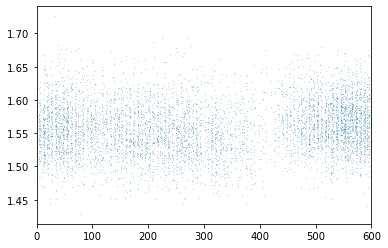

In [21]:
plt.scatter(features.days_since_start,features["std_0"],s=.01)
plt.xlim((0,600))

There
Here
0 breakpoints
There
Here
9 breakpoints
There
Here
11 breakpoints


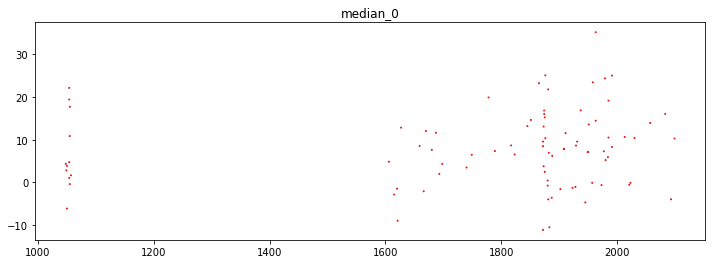

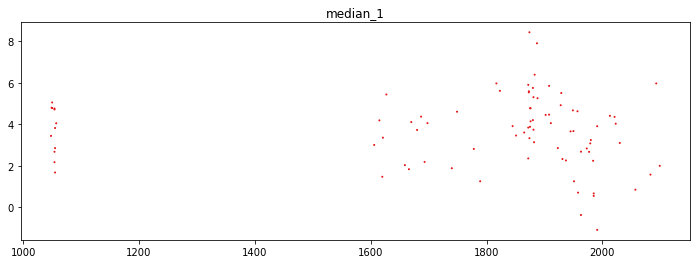

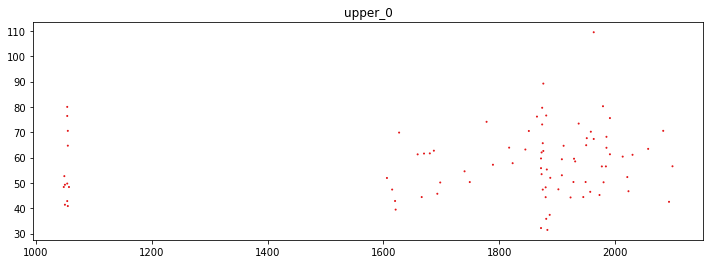

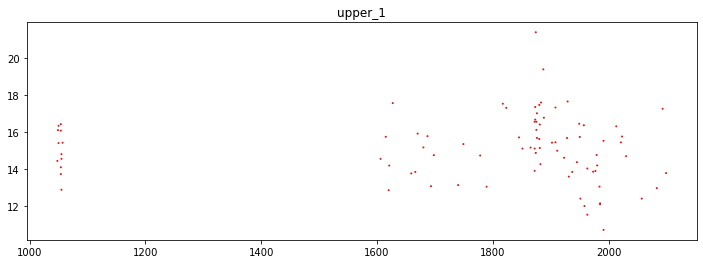

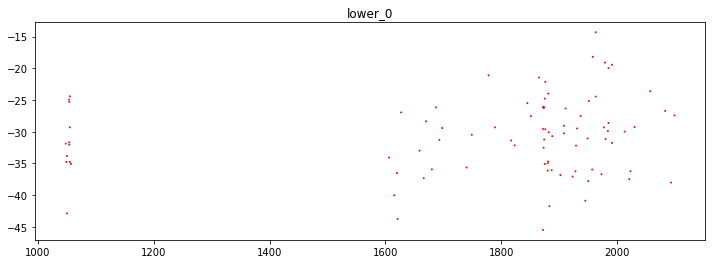

...

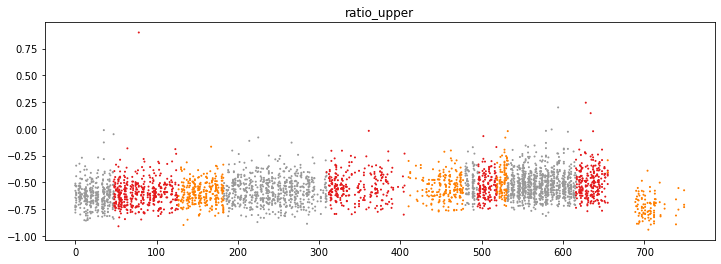

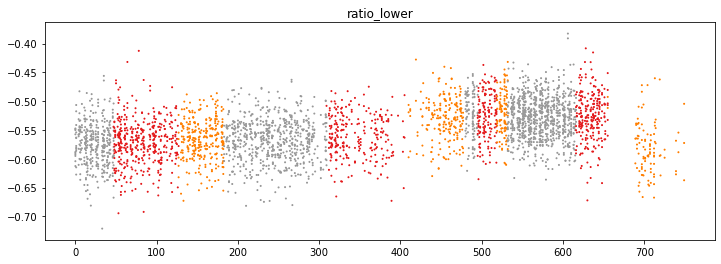

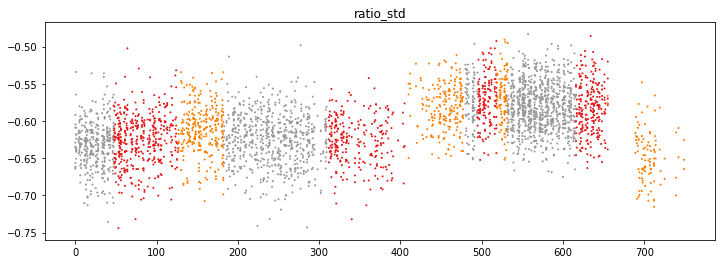

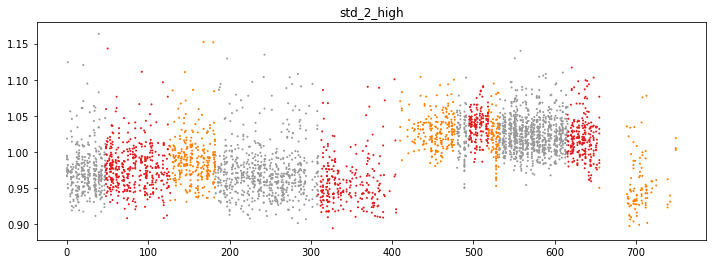

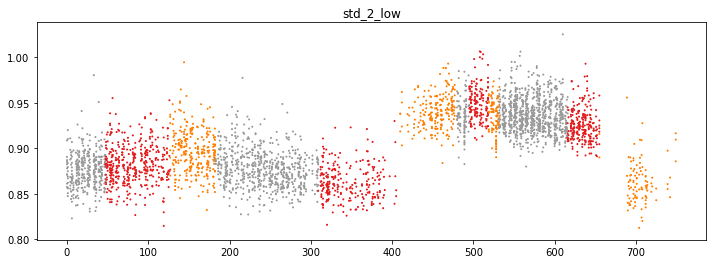

In [22]:
cohort_offset = 0
cohorts_dict = {}
for machine, F in features.groupby("machine"):
    F = F.sort_values("days_since_start")
    F_ = F[F.columns[:-2]]
    F_ -= np.mean(F_,axis=0)
    F_ /= np.std(F_,axis=0)
    print("There")
    algo_c = rp.KernelCPD(kernel="rbf", min_size=min(100,F.shape[0]//2)).fit(
        F_.values
    )
    print("Here")
    F["rank"] = np.arange(F.shape[0])
    bkps = algo_c.predict(pen=1.6)
    bkps = [0] + bkps
    print("%d breakpoints" % (len(bkps)-2))
    F["cohort"] = cohort_offset
    if machine > 0: # We force all PFC samples to be in the same cohort
        # because we want to use tht as a reference cohort
        for b in bkps[1:]:
            F.loc[F["rank"] >= b,"cohort"] += 1
    cohort_offset = F.cohort.max() + 1
    for cohort, f in F.groupby("cohort"):
        assert cohort not in cohorts_dict
        cohorts_dict[cohort] = (machine,f.days_since_start.min(),f.days_since_start.max())
    for i in range(F.shape[1]-4):
        plt.figure(figsize=(12,4))
        plt.scatter(F["days_since_start"],F[F.columns[i]],c=F["cohort"] % 3,s=1,cmap="Set1")
        plt.title(F.columns[i])

In [23]:
# Tag cohorts

cohorts_IDs = {}
tagged_IDs = []
for cohort in cohorts_dict:
    machine, m, M = cohorts_dict[cohort]
    cond = (phen.days_since_start >= m) & (phen.days_since_start <= M) & (phen.machine == machine)
    print(cohort,cond.sum())
    cohorts_IDs[cohort] = [ID for ID in phen.loc[cond].SampleNo.unique().tolist() if ID not in tagged_IDs]
    tagged_IDs += cohorts_IDs[cohort]

0 634
1 3215
2 591
3 2030
4 2152
5 537
6 1265
7 503
8 3278
9 2220
10 343
11 1447
12 1877
13 1153
14 2648
15 1227
16 914
17 375
18 649
19 430
20 3051
21 926
22 375


# Remove the PFC cohort outliers from ref_IDs

In [24]:
# Actually, there are no outliers...
features["OK"] = True
ref_cond = features.index.isin(ref_IDs)
pfc_cond = features.index.str.contains("C")
pfc_ref_cond = ref_cond & pfc_cond
for f in features.columns[:-2]:
    max_deviation = 3*(features.loc[pfc_ref_cond,f].quantile(0.9) -\
                       features.loc[pfc_ref_cond,f].quantile(0.1))
    deviation = (features.loc[pfc_ref_cond,f] -\
                 features.loc[pfc_ref_cond,f].median()).abs()
    features.loc[pfc_ref_cond,"OK"] = features.loc[pfc_ref_cond,"OK"] & (deviation <= max_deviation)

print(len(ref_IDs))
wrong_PFC_IDs = features.loc[~features.OK & pfc_ref_cond].index.tolist()
ref_IDs = [ID for ID in ref_IDs if ID not in wrong_PFC_IDs]
print(len(ref_IDs))
del features["OK"]

7636
7636


# Adjust center and covariance matrix

In [25]:
def correlate(X):
    #/X[cols1].std(axis=0)
    center = X[FACS_COLS].mean(axis=0)
    C = (1./X.shape[0])*((X[FACS_COLS] - center).T) @ ((X[FACS_COLS] - center))
    return C

In [26]:
def adjust_cholesky(Q_ref,Q,center_ref,center,X,plot=False):
    L = cholesky(Q)
    L_ref = cholesky(Q_ref)
    X_decorr = X.copy()
    X_decorr[FACS_COLS] -= center
    X_decorr[FACS_COLS] = X_decorr[FACS_COLS] @ np.linalg.inv(L)

    X_recorr = X_decorr.copy()
    X_recorr[FACS_COLS] = X_recorr[FACS_COLS] @ L_ref
    X_recorr[FACS_COLS] += center_ref
    if plot:
        plt.figure()
        for f in FACS_COLS:
            plt.scatter(X[f],X_recorr[f],label=f)
        plt.legend()
    return X_recorr

In [27]:
ref_cond = X.ID.isin(ref_IDs)

## Compute reference center and Q on PFC cohort

In [28]:
pfc_ref_cond = ref_cond & X.ID.isin(cohorts_IDs[0])

In [29]:
center_pfc = X.loc[pfc_ref_cond,FACS_COLS].mean(axis=0)

In [30]:
center_pfc

FSC    70.208770
SSC    48.271691
SFL    82.871886
dtype: float64

In [31]:
Q_pfc = correlate(X.loc[pfc_ref_cond,FACS_COLS])

In [32]:
Q_pfc

,FSC,SSC,SFL
FSC,726.929027,294.081054,585.629600
SSC,294.081054,214.011396,256.202924
SFL,585.629600,256.202924,536.338445


## Test on one cohort

In [33]:
cohort_index = 13

In [34]:
def transform_cohort(cohort_index):
    cohort_cond = X.ID.isin(cohorts_IDs[cohort_index])
    cohort_ref_cond = ref_cond & cohort_cond
    
    Q_ref_cohort = correlate(X.loc[cohort_ref_cond,FACS_COLS])
    center_ref_cohort = X.loc[cohort_ref_cond,FACS_COLS].mean(axis=0)
    
    X_init = X.loc[cohort_cond].copy()
    X_transformed = X.loc[cohort_cond].copy()
    X_transformed[FACS_COLS] = adjust_cholesky(Q_pfc,Q_ref_cohort,center_pfc,center_ref_cohort,X_transformed[FACS_COLS],plot=False)
    return X_init, X_transformed

In [35]:
X_cohort_init, X_cohort_transformed = transform_cohort(3)

In [36]:
X_init_sample = X_cohort_init.sample(5000)
X_transformed_sample = X_cohort_transformed.sample(5000)
X_pfc_sample = X.loc[X.ID.isin(cohorts_IDs[0])].sample(5000)

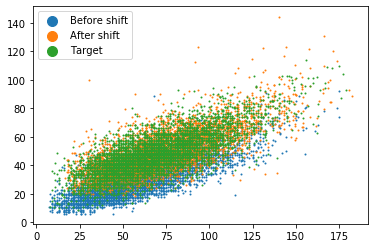

In [40]:
plt.scatter(X_init_sample.FSC,X_init_sample.SSC,s=1,label="Before shift")
plt.scatter(X_transformed_sample.FSC,X_transformed_sample.SSC,s=1,label="After shift")
plt.scatter(X_pfc_sample.FSC,X_pfc_sample.SSC,s=1,label="Target")
plt.legend(markerscale=10);

## Do that on all cohorts

In [41]:
adjusted_Xs = [X.loc[X.ID.isin(cohorts_IDs[0])]]
for cohort_ID in tqdm(cohorts_IDs):
    X_cohort_init, X_cohort_transformed = transform_cohort(cohort_ID)
    adjusted_Xs.append(X_cohort_transformed)

100%|██████████| 23/23 [02:32<00:00,  6.63s/it]


In [42]:
X_adj = pd.concat(adjusted_Xs,axis=0)

# Compute PCs of adjusted scattergrams

In [43]:
pfc_ref_IDs = X.loc[X.ID.str.contains("C") & X.ID.isin(ref_IDs)].ID.unique().tolist()

In [44]:
print("%d ref IDs in PFC cohort" % len(pfc_ref_IDs))

86 ref IDs in PFC cohort


In [45]:
# fit PCA on all adjusted scattergrams of individuals in the reference frame

pca = PCA(n_components=2)
X_adj_t = pd.DataFrame(index=X_adj.index)
pca.fit(X_adj.loc[X_adj.ID.isin(pfc_ref_IDs),FACS_COLS])
X_adj_t[["X_0","X_1"]] = pca.transform(X_adj[FACS_COLS])
X_adj_t["ID"] = X_adj["ID"]

In [46]:
g = X_adj_t.groupby("ID")[["X_0","X_1"]]
#mean = g.mean()
median = g.median()
upper = g.quantile(0.9)
lower = g.quantile(0.1)
std = g.std()
iqr = g.quantile(0.75) - g.quantile(0.25)

print("Starting ratios")

ratio_upper = np.log10((upper["X_1"] - median["X_1"])/ (upper["X_0"] - median["X_1"]))
ratio_lower = np.log10((median["X_1"] - lower["X_1"]) / (median["X_0"] - lower["X_0"]))
ratio_std = np.log10(std["X_1"] / std["X_0"])

std_2_high = g.apply(std_2nd_dim_high)
std_2_low = g.apply(std_2nd_dim_low)

Starting ratios


In [47]:
std[["X_0","X_1"]] = np.log10(std[["X_0","X_1"]])
iqr[["X_0","X_1"]] = np.log10(iqr[["X_0","X_1"]])

In [48]:
features = pd.concat([
           median.rename(columns={"X_0":"median_0","X_1":"median_1"}),
           upper.rename(columns={"X_0":"upper_0","X_1":"upper_1"}),
           lower.rename(columns={"X_0":"lower_0","X_1":"lower_1"}),
           std.rename(columns={"X_0":"std_0","X_1":"std_1"}),
           iqr.rename(columns={"X_0":"iqr_0","X_1":"iqr_1"}),
           pd.DataFrame(ratio_upper).rename(columns={0:"ratio_upper"}),
           pd.DataFrame(ratio_lower).rename(columns={0:"ratio_lower"}),
           pd.DataFrame(ratio_std).rename(columns={0:"ratio_std"}),
           pd.DataFrame(np.log10(std_2_high)).rename(columns={0:"std_2_high"}),
           pd.DataFrame(np.log10(std_2_low)).rename(columns={0:"std_2_low"})],axis=1)
features = features.dropna(how="any",axis=0)

In [49]:
features = pd.merge(features, phen.set_index("SampleNo")[["days_since_start","machine"]],left_index=True,right_index=True,how="inner")
features = features.sort_values(["machine","days_since_start"])

0 breakpoints
9 breakpoints
11 breakpoints


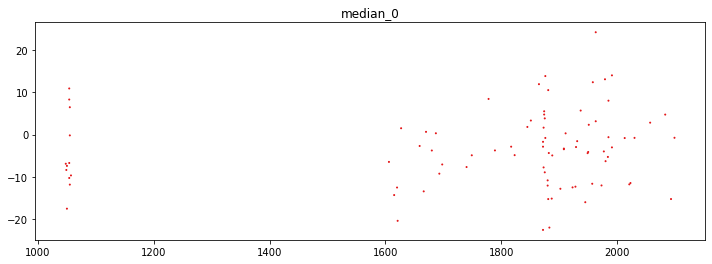

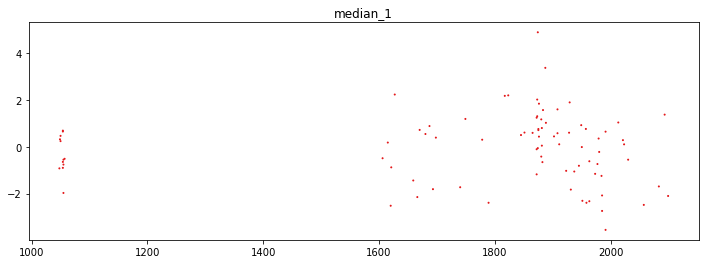

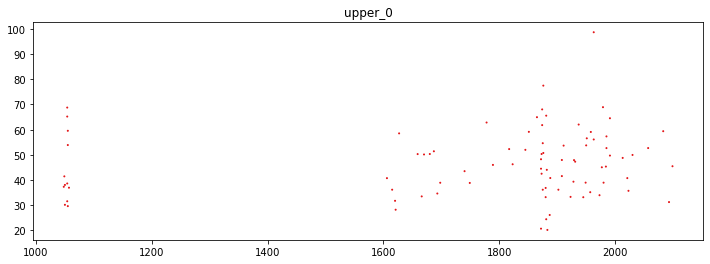

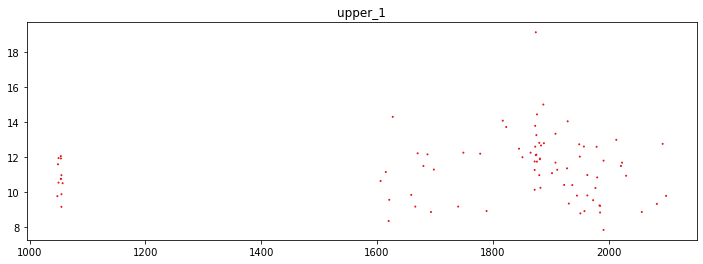

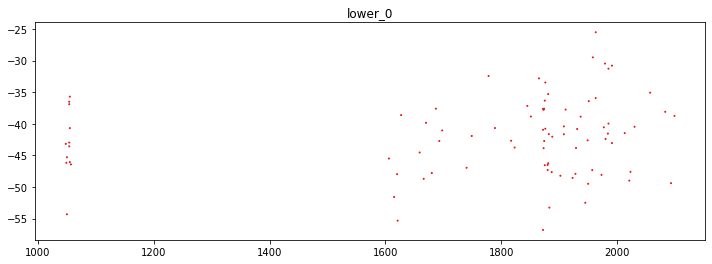

...

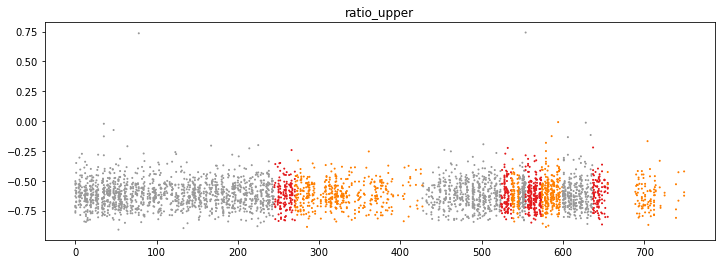

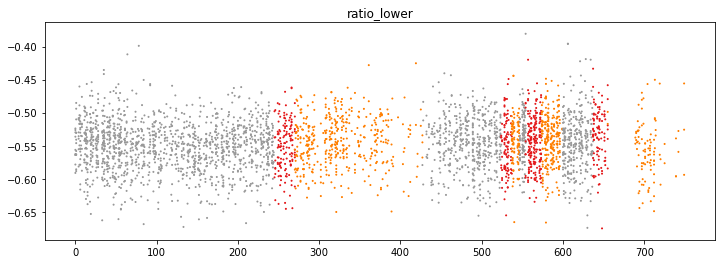

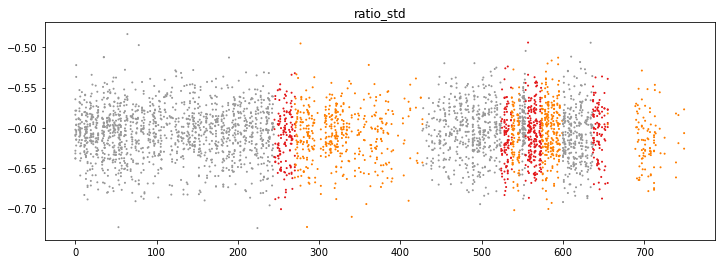

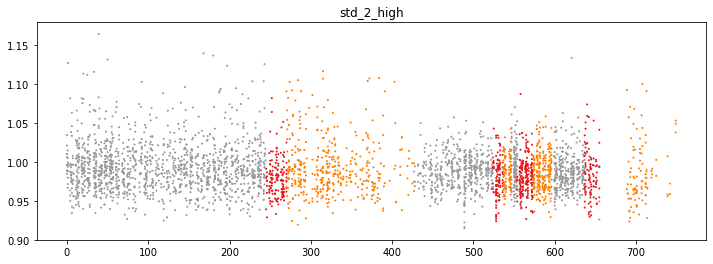

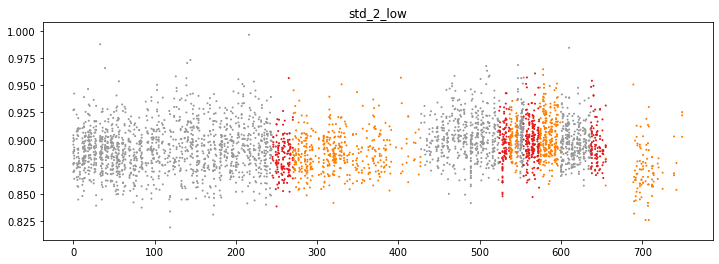

In [50]:
cohort_offset = 0
cohorts_dict = {}
for machine, F in features.loc[features.index.isin(ref_IDs)].groupby("machine"):
    F = F.sort_values("days_since_start")
    F_ = F[F.columns[:-2]]
    F_ -= np.mean(F_,axis=0)
    F_ /= np.std(F_,axis=0)
    
    algo_c = rp.KernelCPD(kernel="rbf", min_size=min(100,F.shape[0]//2)).fit(
        F_.values
    )
    
    F["rank"] = np.arange(F.shape[0])
    bkps = algo_c.predict(pen=1.6)
    bkps = [0] + bkps
    print("%d breakpoints" % (len(bkps)-2))
    F["cohort"] = cohort_offset
    if machine > 0: # We force all PFC samples to be in the same cohort
        # because we want to use tht as a reference cohort
        for b in bkps[1:]:
            F.loc[F["rank"] >= b,"cohort"] += 1
    cohort_offset = F.cohort.max() + 1
    for cohort, f in F.groupby("cohort"):
        assert cohort not in cohorts_dict
        cohorts_dict[cohort] = (machine,f.days_since_start.min(),f.days_since_start.max())
    for i in range(F.shape[1]-4):
        plt.figure(figsize=(12,4))
        plt.scatter(F["days_since_start"],F[F.columns[i]],c=F["cohort"] % 3,s=1,cmap="Set1")
        plt.title(F.columns[i])

In [51]:
# Tag cohorts

cohorts_IDs = {}
tagged_IDs = []
for cohort in cohorts_dict:
    machine, m, M = cohorts_dict[cohort]
    cond = (phen.days_since_start >= m) & (phen.days_since_start <= M) & (phen.machine == machine)
    print(cohort,cond.sum())
    cohorts_IDs[cohort] = [ID for ID in phen.loc[cond].SampleNo.unique().tolist() if ID not in tagged_IDs]
    tagged_IDs += cohorts_IDs[cohort]

0 634
1 2468
2 827
3 618
4 670
5 497
6 564
7 2934
8 5062
9 569
10 1931
11 5782
12 598
13 2022
14 1954
15 465
16 407
17 334
18 752
19 886
20 1134
21 376
22 375


In [52]:
adjusted_features = features.copy()

In [53]:
# Remove outliers
ref_cond = adjusted_features.index.isin(ref_IDs)
adjusted_features["OK"] = True
for cohort in cohorts_dict:
    cohort_cond = adjusted_features.index.isin(cohorts_IDs[cohort])
    cohort_ref_cond = cohort_cond & ref_cond
    print(cohort_ref_cond.sum())
    for f in adjusted_features.columns[:-2]: # 2 last columns aren't features
        max_deviation = 3*(adjusted_features.loc[cohort_cond,f].quantile(0.9) -\
                           adjusted_features.loc[cohort_cond,f].quantile(0.1))
        deviation = (adjusted_features.loc[cohort_cond,f] -\
                     adjusted_features.loc[cohort_cond,f].median()).abs()
        adjusted_features.loc[cohort_cond,"OK"] = adjusted_features.loc[cohort_cond,"OK"] & (deviation <= max_deviation)

86
602
184
136
145
113
111
633
1287
138
537
1374
143
427
468
110
88
120
201
233
305
93
98


In [54]:
adjusted_features.shape

(31353, 18)

In [55]:
adjusted_features.OK.sum()

31321

In [56]:
adjusted_features = adjusted_features.loc[adjusted_features.OK]

In [57]:
del adjusted_features["OK"]

In [58]:
# Adjust features by median value in cohort (computed only on ref individuals)

In [59]:
adjusted_features.columns

Index(['median_0', 'median_1', 'upper_0', 'upper_1', 'lower_0', 'lower_1',
       'std_0', 'std_1', 'iqr_0', 'iqr_1', 'ratio_upper', 'ratio_lower',
       'ratio_std', 'std_2_high', 'std_2_low', 'days_since_start', 'machine'],
      dtype='object')

In [60]:
ref_cond = adjusted_features.index.isin(ref_IDs)

In [61]:
for cohort in cohorts_IDs:
    cohort_cond = adjusted_features.index.isin(cohorts_IDs[cohort])
    cohort_ref_cond = cohort_cond & ref_cond
    for f in adjusted_features.columns[:-2]: # 2 last columns aren't features
        #print(adjusted_features.loc[cohort_ref_cond,f].std())
        adjusted_features.loc[cohort_cond,f] -= adjusted_features.loc[cohort_ref_cond,f].median()
        adjusted_features.loc[cohort_cond,f] /= adjusted_features.loc[cohort_ref_cond,f].std()

In [62]:
# Visualize on ref people

In [63]:
adjusted_features.columns

Index(['median_0', 'median_1', 'upper_0', 'upper_1', 'lower_0', 'lower_1',
       'std_0', 'std_1', 'iqr_0', 'iqr_1', 'ratio_upper', 'ratio_lower',
       'ratio_std', 'std_2_high', 'std_2_low', 'days_since_start', 'machine'],
      dtype='object')

0 breakpoints
2 breakpoints
0 breakpoints


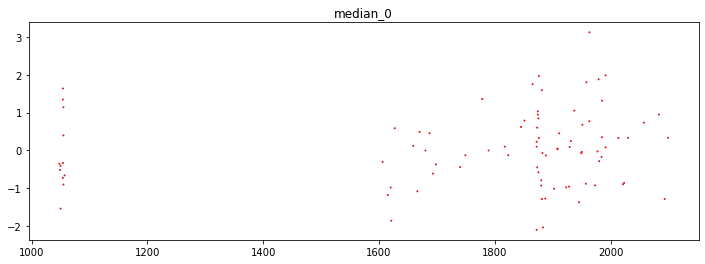

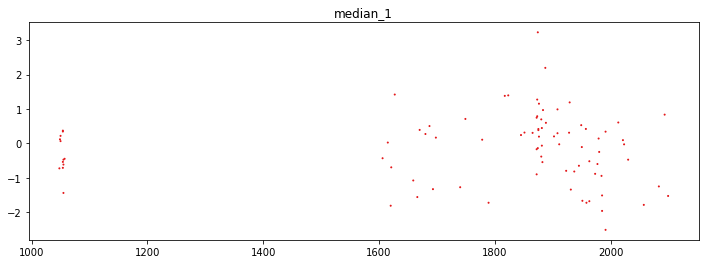

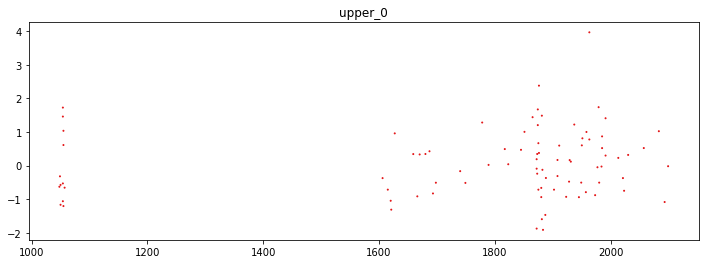

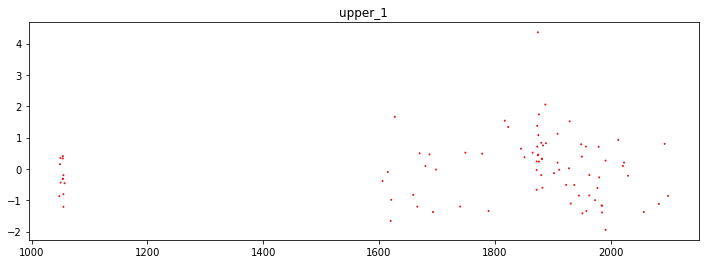

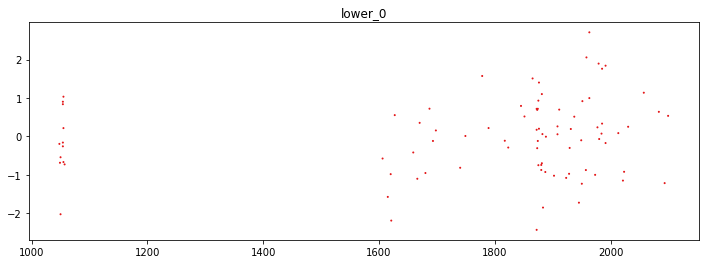

...

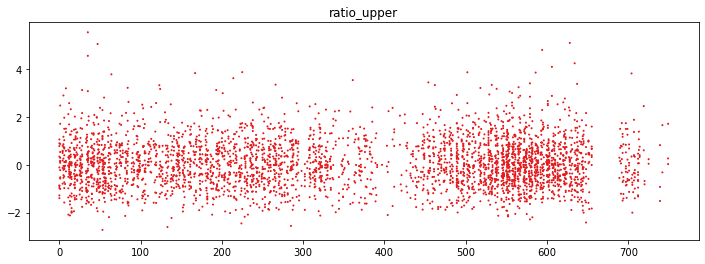

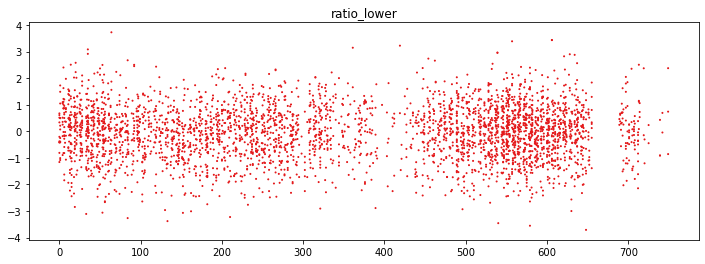

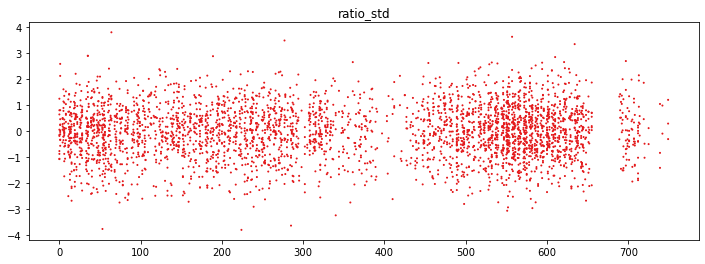

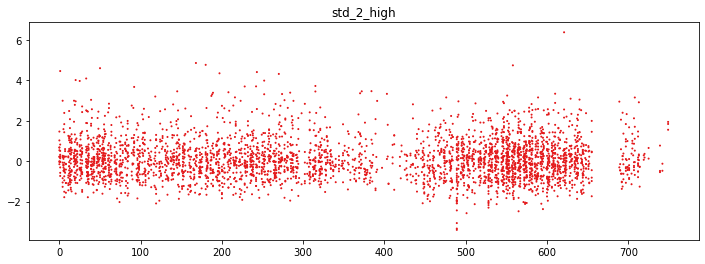

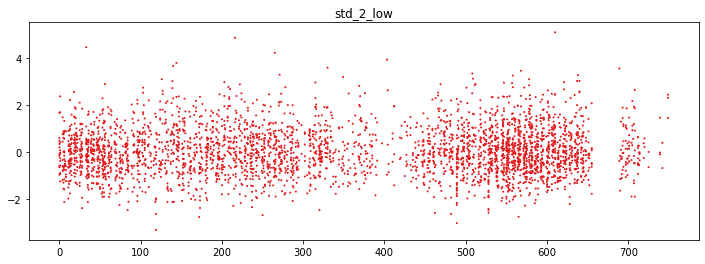

In [64]:
cohort_offset = 0
#cohorts_dict = {}
for machine, F in adjusted_features.loc[adjusted_features.index.isin(ref_IDs)].groupby("machine"):
    F = F.sort_values("days_since_start")
    F_ = F[F.columns[:-2]]
    F_ -= np.mean(F_,axis=0)
    F_ /= np.std(F_,axis=0)
    
    algo_c = rp.KernelCPD(kernel="rbf", min_size=min(100,F.shape[0]//2)).fit(
        F_.values
    )
    
    F["rank"] = np.arange(F.shape[0])
    bkps = algo_c.predict(pen=1.6)
    bkps = [0] + bkps
    print("%d breakpoints" % (len(bkps)-2))
    F["cohort"] = cohort_offset
    if machine > 0: # We force all PFC samples to be in the same cohort
        # because we want to use tht as a reference cohort
        for b in bkps[1:]:
            F.loc[F["rank"] >= b,"cohort"] += 1
    cohort_offset = F.cohort.max() + 1
    #for cohort, f in F.groupby("cohort"):
    #    assert cohort not in cohorts_dict
    #    cohorts_dict[cohort] = (machine,f.days_since_start.min(),f.days_since_start.max())
    for i in range(F.shape[1]-4):
        plt.figure(figsize=(12,4))
        plt.scatter(F["days_since_start"],F[F.columns[i]],c=F["cohort"] % 3,s=1,cmap="Set1")
        plt.title(F.columns[i])

In [65]:
# Visualize on all

2 breakpoints
28 breakpoints
22 breakpoints


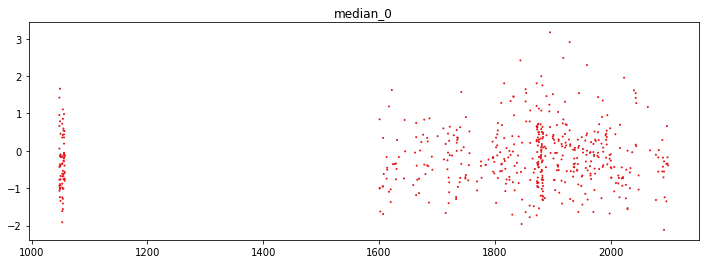

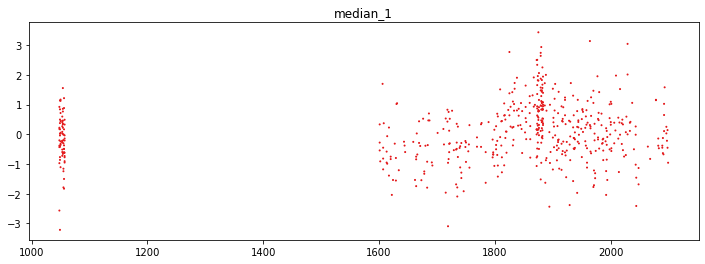

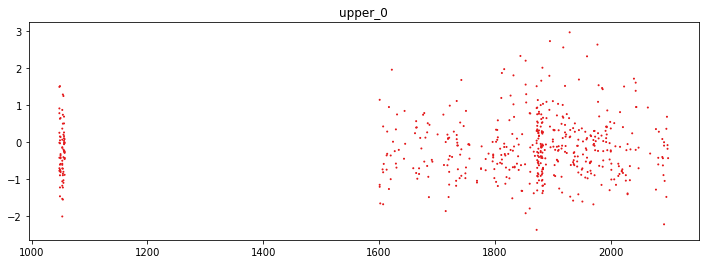

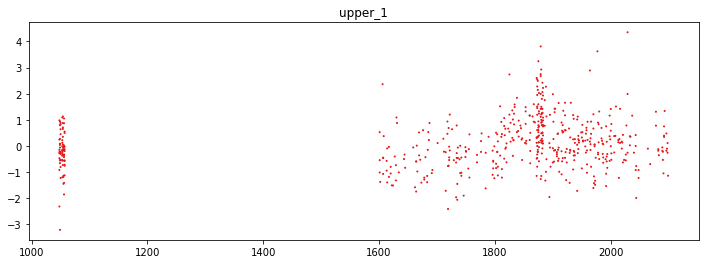

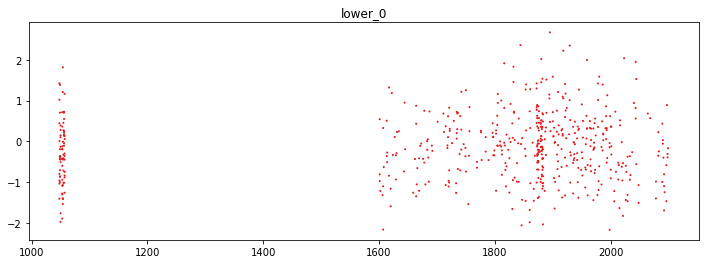

...

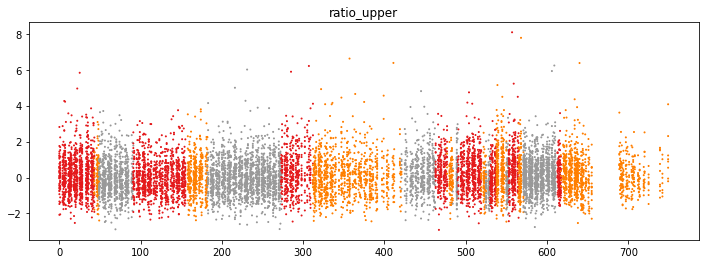

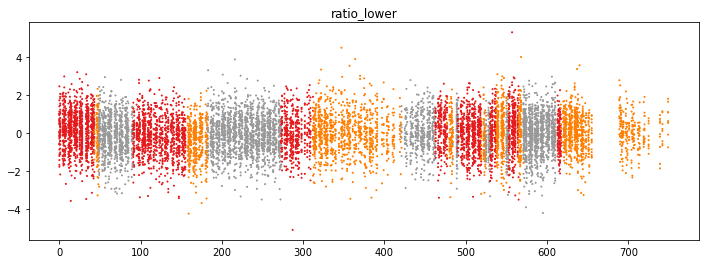

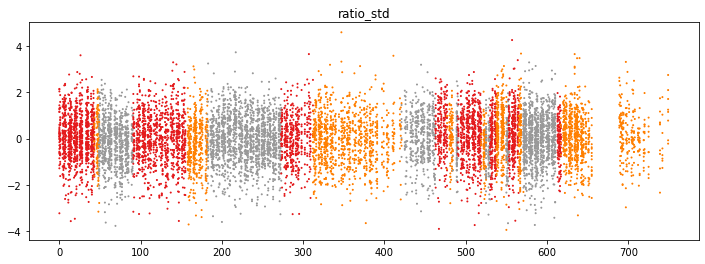

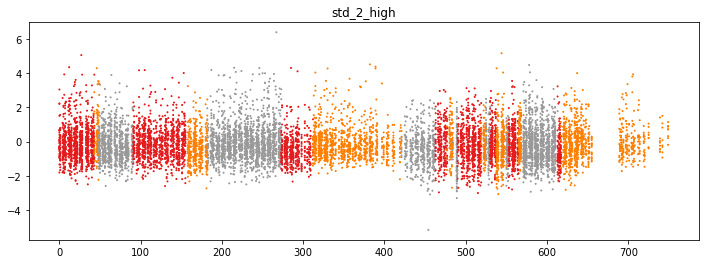

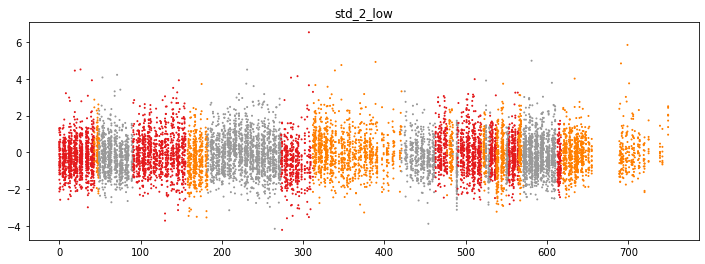

In [66]:
cohort_offset = 0
#cohorts_dict = {}
for machine, F in adjusted_features.loc[~adjusted_features.index.isin(ref_IDs)].groupby("machine"):
    F = F.sort_values("days_since_start")
    F_ = F[F.columns[:-2]]
    F_ -= np.mean(F_,axis=0)
    F_ /= np.std(F_,axis=0)
    
    algo_c = rp.KernelCPD(kernel="rbf", min_size=min(100,F.shape[0]//2)).fit(
        F_.values
    )
    
    F["rank"] = np.arange(F.shape[0])
    bkps = algo_c.predict(pen=2.5)
    bkps = [0] + bkps
    print("%d breakpoints" % (len(bkps)-2))
    F["cohort"] = cohort_offset
    if machine > 0: # We force all PFC samples to be in the same cohort
        # because we want to use tht as a reference cohort
        for b in bkps[1:]:
            F.loc[F["rank"] >= b,"cohort"] += 1
    cohort_offset = F.cohort.max() + 1
    #for cohort, f in F.groupby("cohort"):
    #    assert cohort not in cohorts_dict
    #    cohorts_dict[cohort] = (machine,f.days_since_start.min(),f.days_since_start.max())
    for i in range(F.shape[1]-4):
        plt.figure(figsize=(12,4))
        plt.scatter(F["days_since_start"],F[F.columns[i]],c=F["cohort"] % 3,s=1,cmap="Set1")
        plt.title(F.columns[i])

In [67]:
# Export features

In [68]:
data_dir = "/home/hv270/rds/rds-who1000-cbrc/user/wja24/shared/hv270/data_home"

In [69]:
adjusted_features.to_csv("%s/processed/adjusted_features.csv" % data_dir)

In [70]:
raise "Error"

TypeError: exceptions must derive from BaseException